# Fine-tune Idefics2 on your own use-case

<p align="center">
    <img src="https://huggingface.co/HuggingFaceM4/idefics-80b/resolve/main/assets/IDEFICS.png" alt="Idefics-Obelics logo" width="300" height="300">
</p>

This tutorial showcases how one can fine-tune Idefics2 on their own use-case.

Idefics2 is an open multimodal model that accepts arbitrary sequences of image and text inputs and produces text outputs. The model can answer questions about images, describe visual content, create stories grounded on multiple images, or simply behave as a pure language model without visual inputs. It improves upon Idefics1, significantly enhancing capabilities around OCR, document understanding and visual reasoning.

Read more about Idefics2 this [blogpost](https://huggingface.co/blog/idefics2) and the [model card](https://huggingface.co/HuggingFaceM4/idefics2-8b).

# Setup

We first setup the environment with the primary necessary libraries and login into Hugging Face.

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q accelerate datasets peft bitsandbytes


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 21.2 MB/s eta 0:00:00


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


# Loading the model and the dataset

We load the model from the Hugging Face hub. `idefics2-8b` has gone through instruction fine-tuning on a large mixture of multimodal datasets and as such is a strong starting-point to fine-tune on your own use-case. We will start from this checkpoint.

In this tutorial, we will fine-tune (and evaluate) on the task of Document Visual Question Answering using a subset of the DocVQA dataset.

To accomodate the GPU poors, the default hyper-parameters in this tutorial are chosen so that the fine-tuning takes less than 32 GB of GPU memory. For instance, an V100 in Google Colab should be sufficient.

If you happen to have more ressources, you are encouraged to revisit some of these constraints, in particular:
- Using 4 bit quantization
- Lora fine-tuning
- Freezing the vision encoder
- Small batch size compensated with higher gradient accumulation degree
- Deactivate image splitting
- Using flash-attention

In [64]:
import torch
from peft import LoraConfig
from transformers import AutoProcessor, BitsAndBytesConfig, Idefics2ForConditionalGeneration

DEVICE = "cuda:0"
USE_LORA = False
USE_QLORA = True


processor = AutoProcessor.from_pretrained(
    "HuggingFaceM4/idefics2-8b",
    do_image_splitting=False
)


# Three options for training, from the lowest precision training to the highest precision training:
# - QLora
# - Standard Lora
# - Full fine-tuning
if USE_QLORA or USE_LORA:
    lora_config = LoraConfig(
        r=8,
        lora_alpha=8,
        lora_dropout=0.1,
        target_modules='.*(text_model|modality_projection|perceiver_resampler).*(down_proj|gate_proj|up_proj|k_proj|q_proj|v_proj|o_proj).*$',
        use_dora=False if USE_QLORA else True,
        init_lora_weights="gaussian"
    )
    if USE_QLORA:
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_quant_type="nf4",
            bnb_4bit_compute_dtype=torch.float16
        )
    model = Idefics2ForConditionalGeneration.from_pretrained(
        "HuggingFaceM4/idefics2-8b",
        torch_dtype=torch.float16,
        quantization_config=bnb_config if USE_QLORA else None,
    )
    model.add_adapter(lora_config)
    model.enable_adapters()
else:
    model = Idefics2ForConditionalGeneration.from_pretrained(
        "HuggingFaceM4/idefics2-8b",
        torch_dtype=torch.float16,
        _attn_implementation="flash_attention_2", # Only available on A100 or H100
    ).to(DEVICE)



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [76]:
import gc

gc.collect()

torch.cuda.empty_cache()

In [66]:
import json
from PIL import Image
import base64
import io

# Function to load image from base64 string
def load_image_from_str(image_str):
    # Decode base64 string to binary data
    img_data = base64.b64decode(image_str)
    # Create a BytesIO object from binary data
    img_buffer = io.BytesIO(img_data)
    # Open the image using PIL
    image = Image.open(img_buffer)
    return image

# Load dataset from JSON file
with open('clothing_dataset.json', 'r') as f:
    train_dataset = json.load(f)

# Convert image strings to PIL images
for data_point in train_dataset:
    image_str = data_point['image']
    image = load_image_from_str(image_str)
    data_point['image'] = image  # Replace image string with PIL image

# Now dataset contains PIL images in the 'image' field

Let's look at an example. Each sample has an image of a document, a question (in multiple languages, although we'll use the English portion only), and a list of answers.

In [67]:
train_dataset[5]


{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x1066>,
 'query': {'en': 'Would this piece of clothing look good on me?'},
 'answers': ['No']}

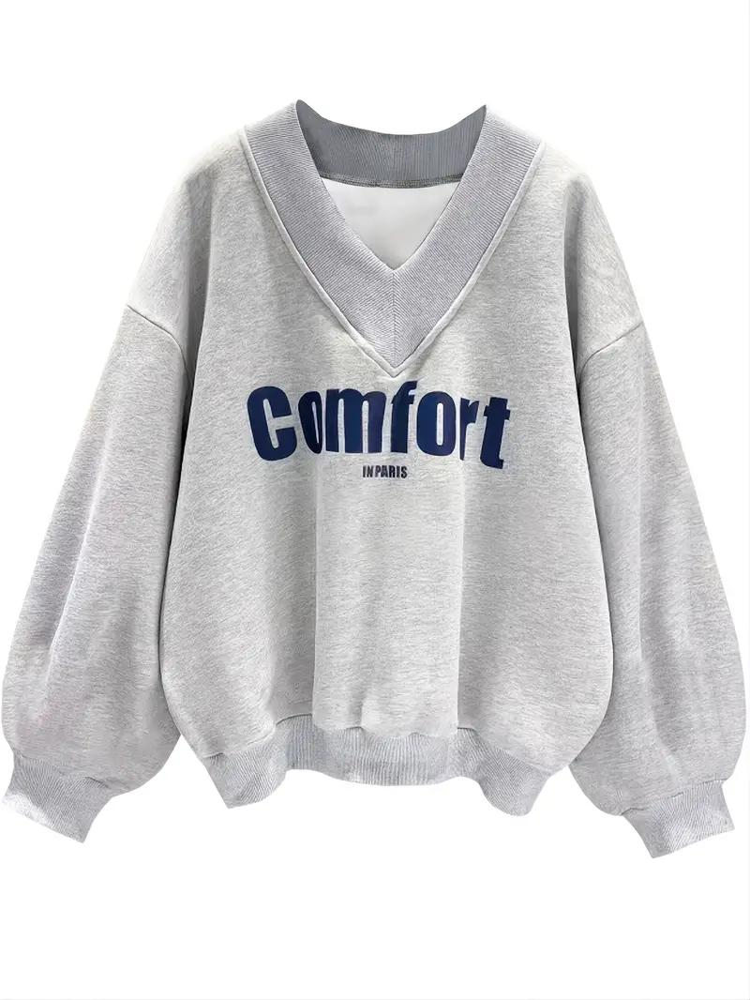

In [ ]:
# Example usage
image = train_dataset[5]['image']
image  # Display the loaded image

# Training loop

We first define the data collator which takes list of samples and return input tensors fed to the model. There are 4 tensors types we are interested:
- `input_ids`: these are the input indices fed to the language model
- `attention_mask`: the attention mask for the `input_ids` in the language model
- `pixel_values`: the (pre-processed) pixel values that encode the image(s). Idefics2 treats images in their native resolution (up to 980) and their native aspect ratio
- `pixel_attention_mask`: when multiple image(s) are packed into the same sample (or in the batch), attention masks for the images are necessary because of these images can have different sizes and aspect ratio. This masking ensures that the vision encoder properly forwards the images.


In [68]:
import random

class MyDataCollator:
    def __init__(self, processor):
        self.processor = processor
        self.image_token_id = processor.tokenizer.additional_special_tokens_ids[
            processor.tokenizer.additional_special_tokens.index("<image>")
        ]

    def __call__(self, examples):
        texts = []
        images = []
        for example in examples:
            image = example["image"]
            question = example["query"]["en"]
            answer = random.choice(example["answers"])
            messages = [
                {
                    "role": "user",
                    "content": [
                        {"type": "text", "text": "Answer briefly."},
                        {"type": "image"},
                        {"type": "text", "text": question}
                    ]
                },
                {
                    "role": "assistant",
                    "content": [
                        {"type": "text", "text": answer}
                    ]
                }
            ]
            text = processor.apply_chat_template(messages, add_generation_prompt=False)
            texts.append(text.strip())
            images.append([image])

        batch = processor(text=texts, images=images, return_tensors="pt", padding=True)

        labels = batch["input_ids"].clone()
        labels[labels == processor.tokenizer.pad_token_id] = self.image_token_id
        batch["labels"] = labels

        return batch

data_collator = MyDataCollator(processor)


We will use HuggingFace Trainer.

In [78]:
from transformers import TrainingArguments, Trainer

training_args = TrainingArguments(
    num_train_epochs=2,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=8,
    warmup_steps=50,
    learning_rate=1e-4,
    weight_decay=0.01,
    logging_steps=25,
    output_dir="/content/drive/My Drive/docvqa_ft_tutorial",
    save_strategy="steps",
    save_steps=250,
    save_total_limit=1,
    # evaluation_strategy="epoch",
    fp16=True,
    push_to_hub_model_id="idefics2-8b-finetuned-fashion",
    remove_unused_columns=False,
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=train_dataset,
    # eval_dataset=eval_dataset, # You can also evaluate (loss) on the eval set, note that it will incur some additional GPU memory
)


/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1977: FutureWarning: `--push_to_hub_model_id` is deprecated and will be removed in version 5 of 🤗 Transformers. Use `--hub_model_id` instead and pass the full repo name to this argument (in this case ramtin-ehsani/idefics2-8b-finetuned-fashion).
  warnings.warn(


# Training and pushing to the hub

We have all the core building blocks now, so we fine-tune the model!

The training can take a few minutes depending on the hardware you use.

In [79]:
trainer.train()

Step,Training Loss


TrainOutput(global_step=2, training_loss=5.484790325164795, metrics={'train_runtime': 33.337, 'train_samples_per_second': 0.6, 'train_steps_per_second': 0.06, 'total_flos': 71620120028160.0, 'train_loss': 5.484790325164795, 'epoch': 1.6})

We push to the fine-tuned checkpoint to the hub!

In [80]:
trainer.push_to_hub()

/usr/local/lib/python3.10/dist-packages/transformers/integrations/peft.py:399: FutureWarning: The `active_adapter` method is deprecated and will be removed in a future version.
  warnings.warn(


Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

training_args.bin:   0%|          | 0.00/5.24k [00:00<?, ?B/s]

adapter_model.safetensors:   0%|          | 0.00/93.4M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/ramtin-ehsani/idefics2-8b-finetuned-fashion/commit/a1afec4d80abf520b2d44b3786a211eb1ba51545', commit_message='End of training', commit_description='', oid='a1afec4d80abf520b2d44b3786a211eb1ba51545', pr_url=None, pr_revision=None, pr_num=None)

# Evaluation

Let's evaluate the model. First, we can have a look at a qualitative generation from the model.

In [81]:
eval_dataset = train_dataset
example = eval_dataset[2]
example


{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3840x3840>,
 'query': {'en': 'Would this piece of clothing look good on me?'},
 'answers': ['No']}

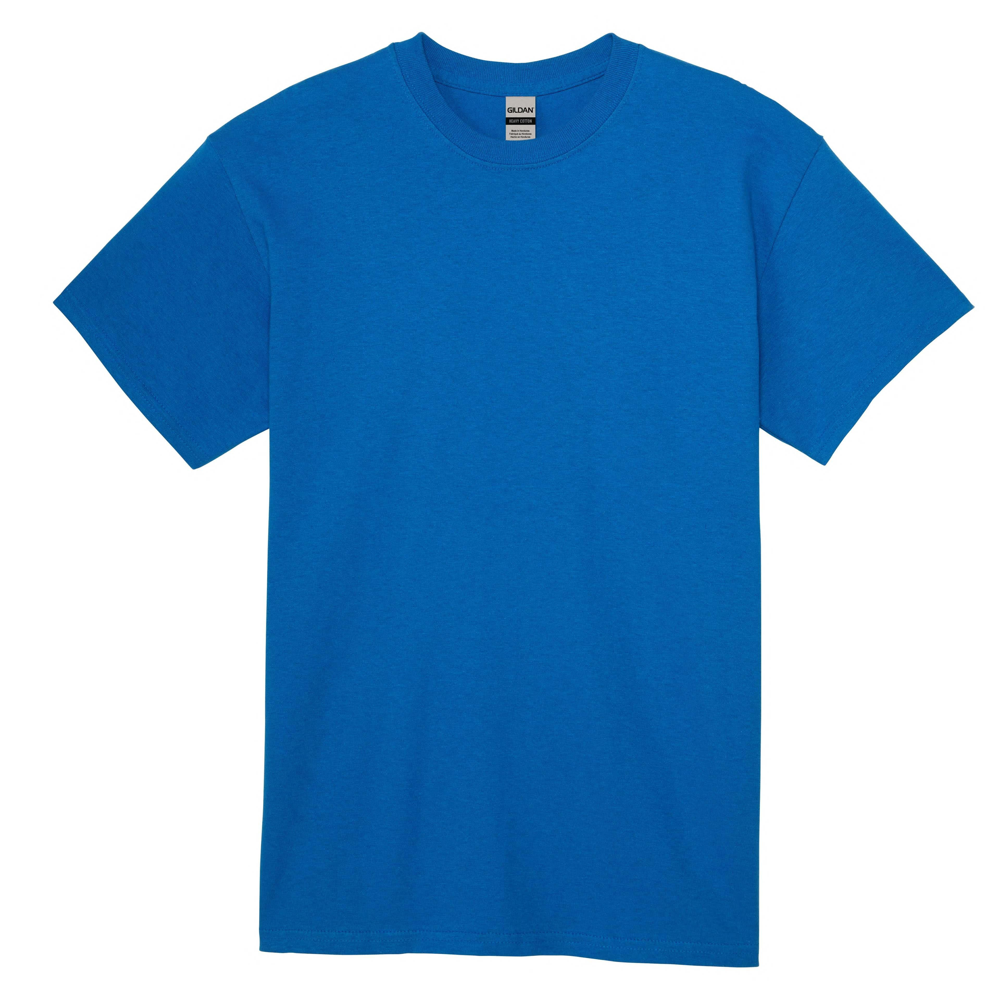

In [82]:
example["image"]

In [85]:
model.eval()
evals = []
for example in eval_dataset:
  image = example["image"]
  query = example["query"]

  messages = [
      {
          "role": "user",
          "content": [
              {"type": "text", "text": "Answer briefly."},
              {"type": "image"},
              {"type": "text", "text": query["en"]}
          ]
      }
  ]
  text = processor.apply_chat_template(messages, add_generation_prompt=True)
  inputs = processor(text=[text.strip()], images=[image], return_tensors="pt", padding=True)
  inputs = inputs.to(model.device)
  generated_ids = model.generate(**inputs, max_new_tokens=64)
  generated_texts = processor.batch_decode(generated_ids[:, inputs["input_ids"].size(1):], skip_special_tokens=True)
  print(generated_texts)
  evals.append(generated_texts)

['Yes.']
['Answer may vary.']
['No.']
['Yes.']
['No.']
['No.']
['Yes.']
['No.']
['No.']
['Yes.']


## Testing

In [3]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix

actual_answers = ['No.', 'No.', 'No.', 'No.', 'No.', 'No.', 'Yes.', 'Yes.', 'Yes.', 'Yes.']
evals = ['Yes.', 'Answer may vary.', 'No.', 'Yes.', 'No.', 'No.', 'Yes.', 'No.', 'No.', 'Yes.']

# Calculate accuracy
accuracy = accuracy_score(actual_answers, evals)

# Exclude 'answer may vary' from precision and recall calculations
filtered_results = [pred for pred in evals if pred != 'answer may vary']
filtered_answers = [ans for ans, pred in zip(actual_answers, evals) if pred != 'answer may vary']

# Calculate precision
if filtered_results:  # Check if there are non-'answer may vary' predictions
    precision = precision_score(filtered_answers, filtered_results, average='weighted')
else:
    precision = None

# Calculate recall
if filtered_results:  # Check if there are non-'answer may vary' predictions
    recall = recall_score(filtered_answers, filtered_results, average='weighted')
else:
    recall = None

# Calculate confusion matrix
conf_matrix = confusion_matrix(actual_answers, evals)

# Print results
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.5
Precision: 0.5599999999999999
Recall: 0.5
Confusion Matrix:
[[0 0 0]
 [1 3 2]
 [0 2 2]]


/Users/re378/Documents/GradSchool/Courses/CS614/Vision/venv/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
